In [4]:
import os
from PIL import Image
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import cv2
from pathlib import Path
from skimage import metrics

In [5]:
def load_data(directory):
    data = []
    labels = []
    filenames = []

    image_files = os.listdir(directory)
    for img_filename in tqdm(image_files, desc=f"Loading from {directory}", unit=" files"):
        img_path = os.path.join(directory, img_filename)
        image = Image.open(img_path).convert('L')  # Assuming you want to convert to grayscale
        image = Image.open(img_path).convert('L')  # Convert to grayscale
        image = image.resize((256, 256))  # Resize the image to 256x256 pixels
        image = np.array(image)
        data.append(image)
        # Assuming all images in a directory have the same label, derived from directory name
        label = 1 if 'yes' in directory else 0
        labels.append(label)
        filenames.append(img_filename)
    
    return np.array(data), np.array(labels), filenames

In [6]:
# Paths to your dataset directories
yes_ori_directory = 'C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Ori/yes'
no_ori_directory = 'C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Ori/no'


In [7]:
# Usage
yes_ori_data, yes_ori_labels, yes_ori_filenames = load_data(yes_ori_directory)
no_ori_data, no_ori_labels, no_ori_filenames = load_data(no_ori_directory)

Loading from C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Ori/yes: 100%|██████████| 155/155 [00:01<00:00, 119.54 files/s]
Loading from C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Ori/no: 100%|██████████| 155/155 [00:02<00:00, 66.16 files/s] 


In [8]:
def add_gaussian_noise(image):
    row, col = image.shape  # Updated to handle only 2 dimensions for grayscale
    mean = 0
    std = 15
    gauss = np.random.normal(mean, std, (row, col)).reshape(row, col)  # Noise for grayscale
    noisy_image = cv2.add(image.astype('float32'), gauss.astype('float32'))  # Ensuring proper addition
    return noisy_image.clip(0, 255).astype('uint8')
    
def ensure_dir(file_path):
    if not os.path.exists(file_path):
        os.makedirs(file_path)
        
def process_and_save(data, labels, filenames, directory):
    categories = ['no','yes']

    for i in tqdm(range(len(data)), desc="Processing Images"):
        image = data[i]
        label = labels[i]
        filename = filenames[i]
        category = categories[label]

        # Directory for processed images
        save_dir = os.path.join(directory, category)
        ensure_dir(save_dir)  # Ensure this directory exists

        # Preprocessing steps
        noised_image=add_gaussian_noise(image)


        # Save the processed image
        save_path = os.path.join(save_dir, filename)
        cv2.imwrite(save_path, noised_image)

In [9]:
# Specify the directories where the processed images will be saved
processed_yes_noised_dir = 'C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Noised'
processed_no_noised_dir = 'C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Noised'

# Process and save training and testing data
process_and_save(yes_ori_data, yes_ori_labels, yes_ori_filenames, processed_yes_noised_dir)
process_and_save(no_ori_data, no_ori_labels, no_ori_filenames, processed_no_noised_dir)

Processing Images: 100%|██████████| 155/155 [00:02<00:00, 51.96it/s]


In [10]:
# Function to display images based on label
def display_images(data, labels, label, num_images=12):
    plt.figure(figsize=(15, 10))  # Increase figure size for better visibility
    count = 0
    for i in range(len(data)):
        if labels[i] == label and count < num_images:
            plt.subplot(3, 4, count + 1)  # Display images in a 3x4 grid
            img = data[i]
            plt.imshow(img, cmap='gray')
            # Display both label and dimensions (width x height)
            plt.title(f'Label: {label}, Shape: {img.shape[1]}x{img.shape[0]}')
            plt.axis('off')
            count += 1
    plt.tight_layout()
    plt.show()

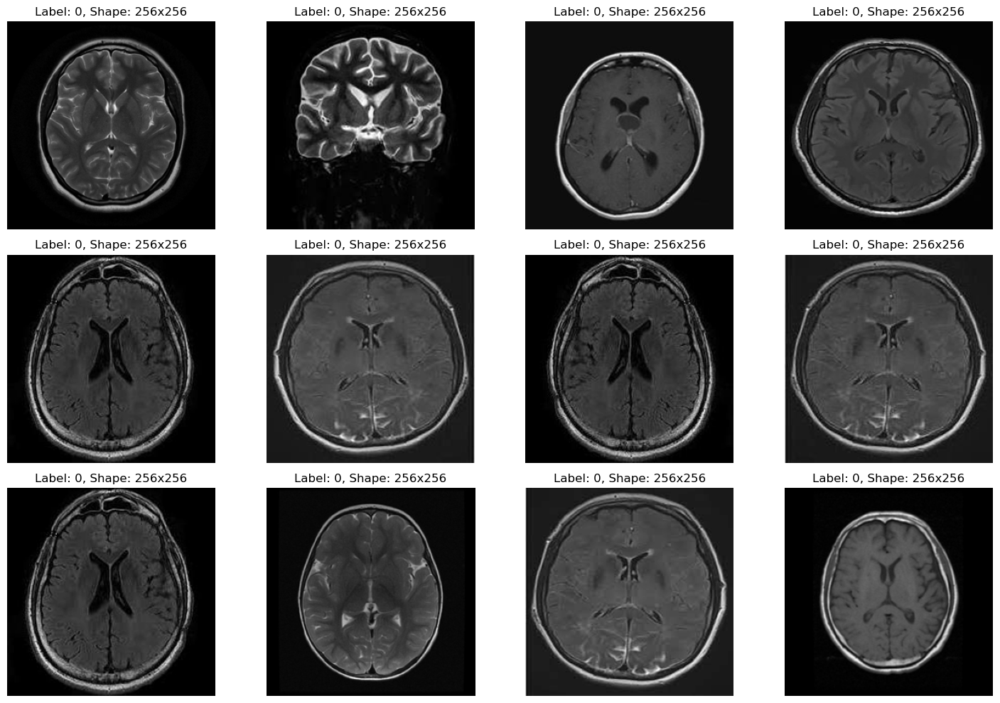

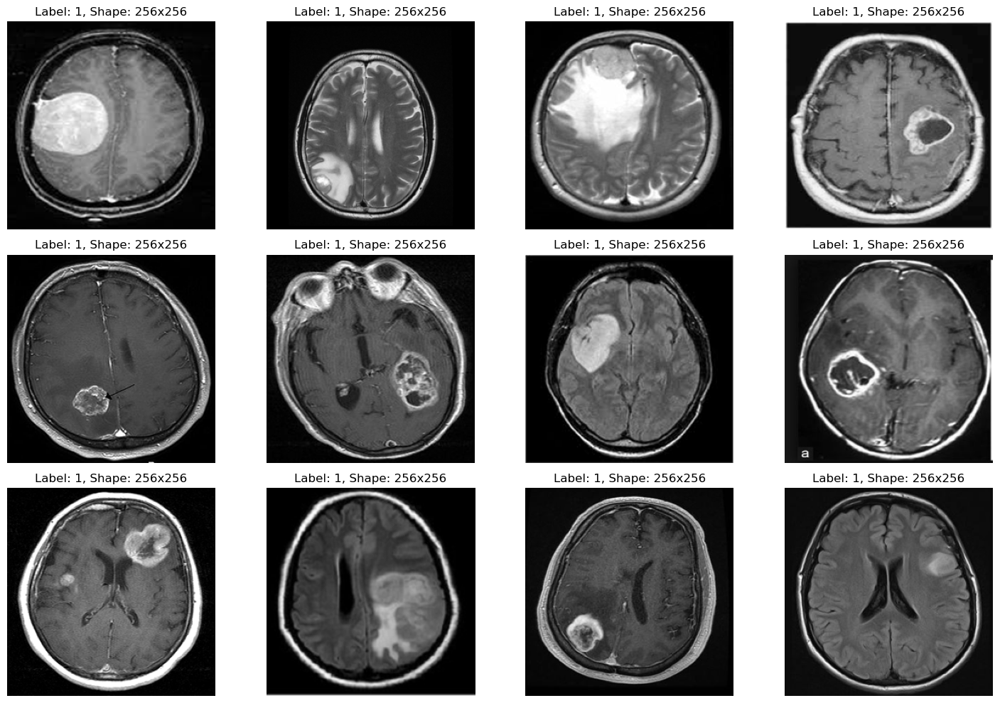

In [11]:
# Display 12 images for label 0 (no tumor)
display_images(no_ori_data, no_ori_labels, 0)

# Display 12 images for label 1 (tumor)
display_images(yes_ori_data, yes_ori_labels, 1)

In [12]:
# Paths to your dataset directories
yes_noised_directory = 'C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Noised/yes'
no_noised_directory = 'C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Noised/no'


In [13]:
# Usage
yes_noised_data, yes_noised_labels, yes_noised_filenames = load_data(yes_noised_directory)
no_noised_data, no_noised_labels, no_noised_filenames = load_data(no_noised_directory)

Loading from C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Noised/yes: 100%|██████████| 155/155 [00:01<00:00, 85.07 files/s]
Loading from C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Noised/no: 100%|██████████| 155/155 [00:05<00:00, 26.68 files/s]


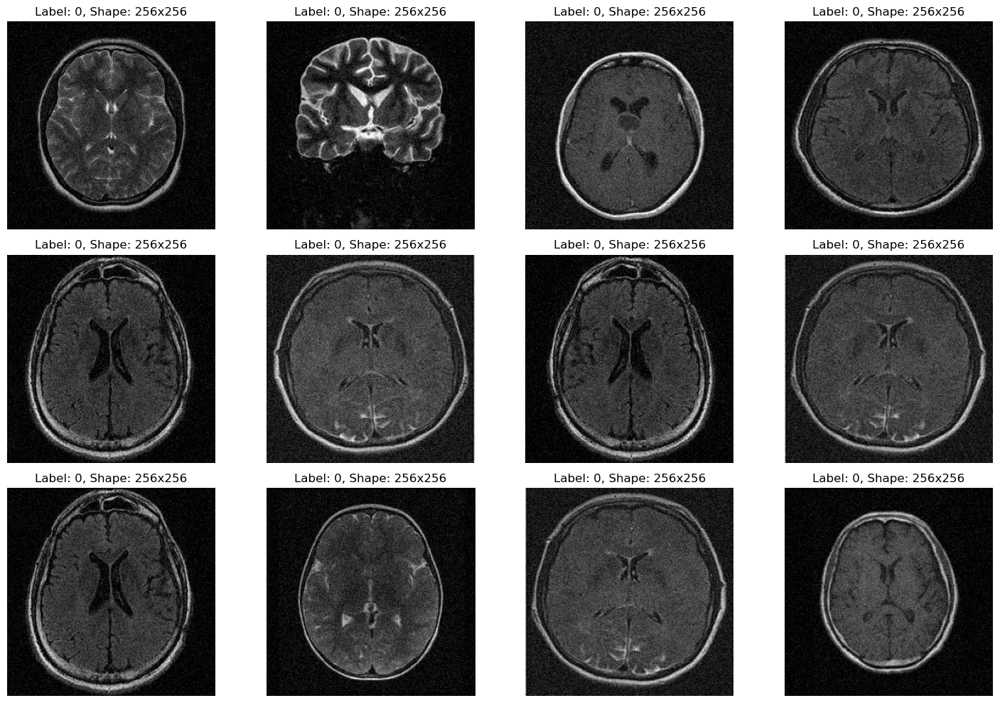

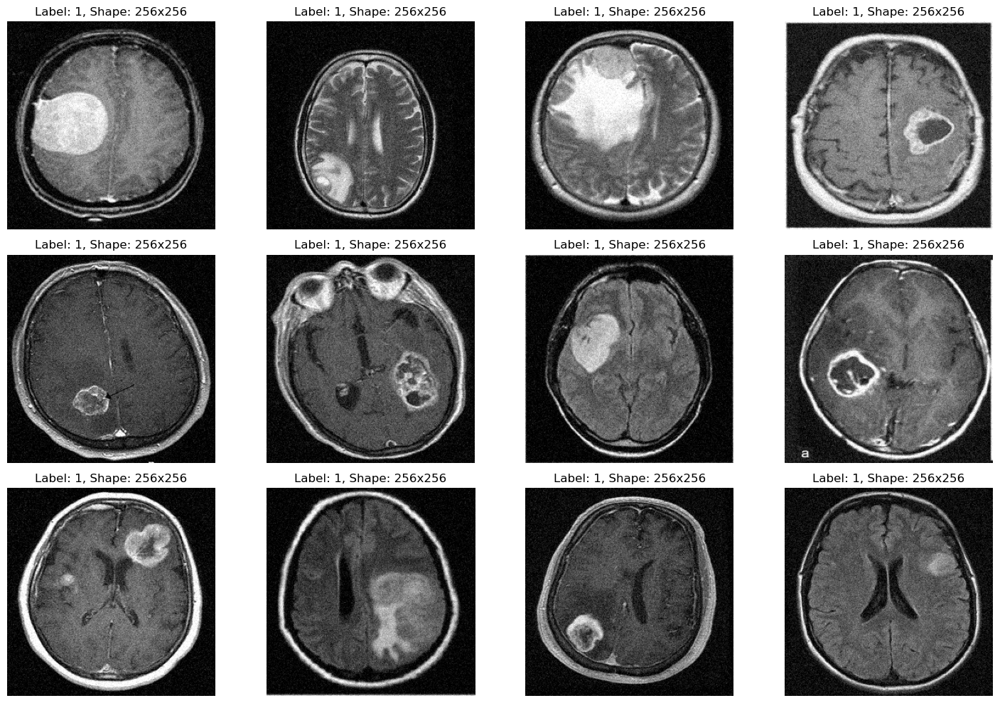

In [14]:
# Display 12 images for label 0 (no tumor)
display_images(no_noised_data, no_noised_labels, 0)

# Display 12 images for label 1 (tumor)
display_images(yes_noised_data, yes_noised_labels, 1)

In [15]:
def denoise_image(image):
    """Applies Non-Local Means Denoising to an image."""
    h = 15  # Filter strength.
    templateWindowSize = 7  # Size of the template patch.
    searchWindowSize = 21  # Size of the window that is used to compute weighted average.
    denoised_image = cv2.fastNlMeansDenoising(image, None, h, templateWindowSize, searchWindowSize)
    return denoised_image

def enhance_contrast(image):
    """Enhances the contrast of an image using CLAHE."""
    clahe = cv2.createCLAHE(clipLimit=0.5, tileGridSize=(8, 8))
    contrast_enhanced_image = clahe.apply(image)
    return contrast_enhanced_image

def enhance_contrast(image):
    """Enhances the contrast of an image using CLAHE."""
    clahe = cv2.createCLAHE(clipLimit=1.0, tileGridSize=(8, 8))
    contrast_enhanced_image = clahe.apply(image)
    return contrast_enhanced_image

def apply_unsharp_mask(image):
    """Applies unsharp masking to enhance image sharpness."""
    blurred_base = cv2.GaussianBlur(image, (3, 3), 0)
    unsharp_mask = cv2.addWeighted(image, 1.3, blurred_base, -0.3, 0)
    return unsharp_mask


In [16]:
def ensure_dir(file_path):
    if not os.path.exists(file_path):
        os.makedirs(file_path)
      
def final_process_and_save(data, labels, filenames, directory):
    categories = ['no','yes']

    for i in tqdm(range(len(data)), desc="Processing Images"):
        image = data[i]
        label = labels[i]
        filename = filenames[i]
        category = categories[label]

        # Directory for processed images
        save_dir = os.path.join(directory, category)
        ensure_dir(save_dir)  # Ensure this directory exists

        # Apply processing steps
        denoised_image = denoise_image(image)
        contrast_image = enhance_contrast(denoised_image)
        final_image = apply_unsharp_mask(contrast_image)


        # Save the processed image
        save_path = os.path.join(save_dir, filename)
        cv2.imwrite(save_path, final_image)

In [17]:
# Specify the directories where the processed images will be saved
final_processed_yes_dir = 'C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Preprocessed2'
final_processed_no_dir = 'C:/Users/limvi/Desktop/FYP1/BrainTumorDataset-Preprocessed2'

# Process and save training and testing data
final_process_and_save(yes_noised_data, yes_noised_labels, yes_noised_filenames, final_processed_yes_dir)
final_process_and_save(no_noised_data, no_noised_labels, no_noised_filenames, final_processed_no_dir)

Processing Images: 100%|██████████| 155/155 [01:56<00:00,  1.33it/s]


In [18]:
import matplotlib.pyplot as plt

def process_and_display_images(image_data, num_images=5):
    for i in range(num_images):
        image = image_data[i]
        
        # Process the image through each step
        denoised_image = denoise_image(image)
        contrast_image = enhance_contrast(denoised_image)
        final_image = apply_unsharp_mask(contrast_image)
        
        # Display each step
        fig, ax = plt.subplots(1, 4, figsize=(15, 3))
        ax[0].imshow(image, cmap='gray')
        ax[0].set_title('Original Image')
        ax[0].axis('off')
        
        ax[1].imshow(denoised_image, cmap='gray')
        ax[1].set_title('Denoised Image')
        ax[1].axis('off')
        
        
        ax[2].imshow(contrast_image, cmap='gray')
        ax[2].set_title('Contrast Enhanced')
        ax[2].axis('off')
        
        ax[3].imshow(final_image, cmap='gray')
        ax[3].set_title('Unsharp Mask Image')
        ax[3].axis('off')
        
        plt.tight_layout()
        plt.show()



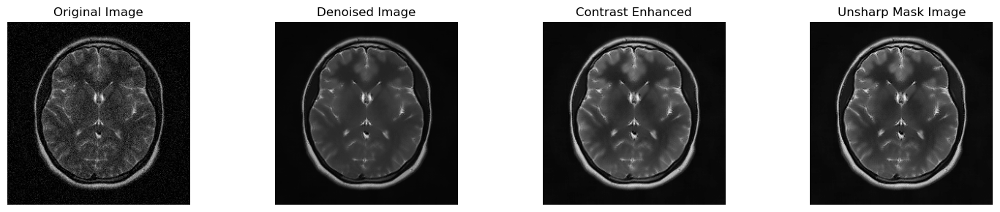

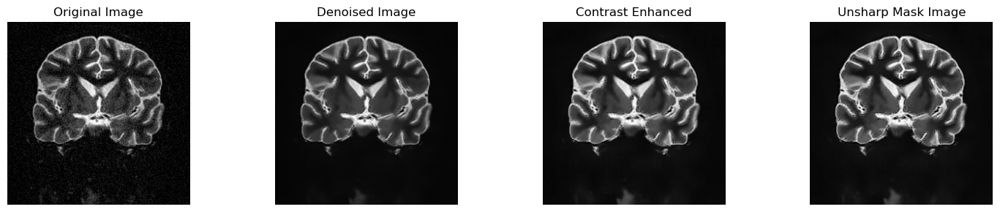

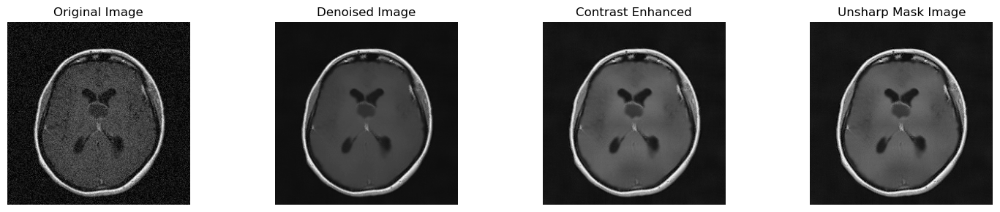

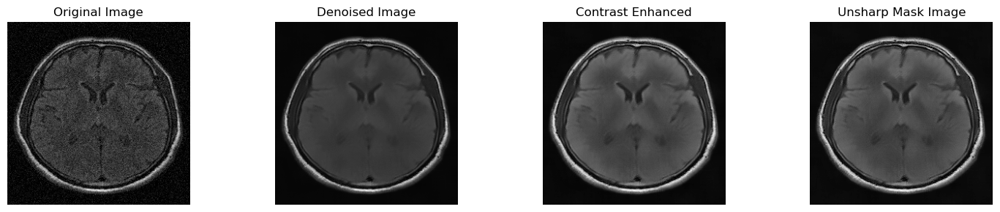

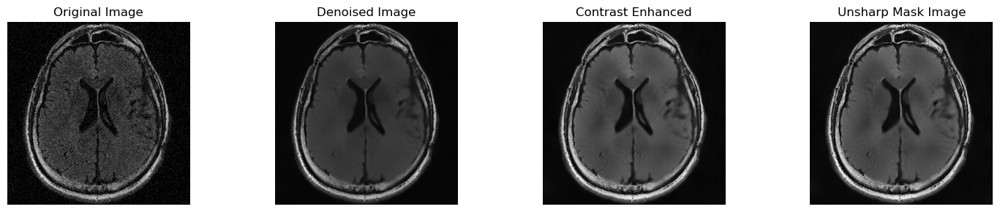

In [19]:
process_and_display_images(no_noised_data, num_images=5)

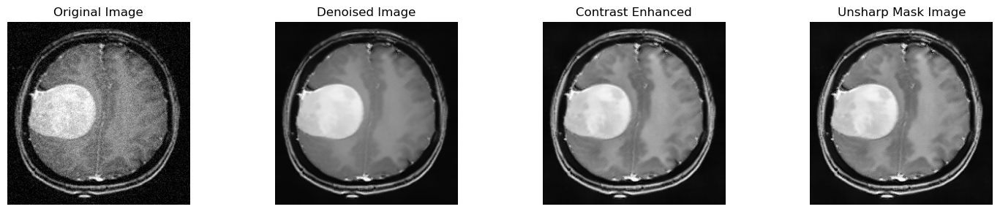

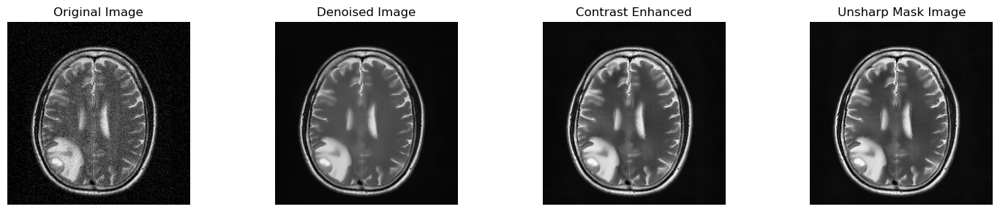

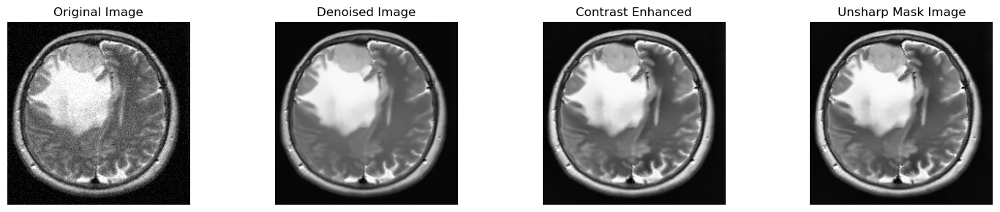

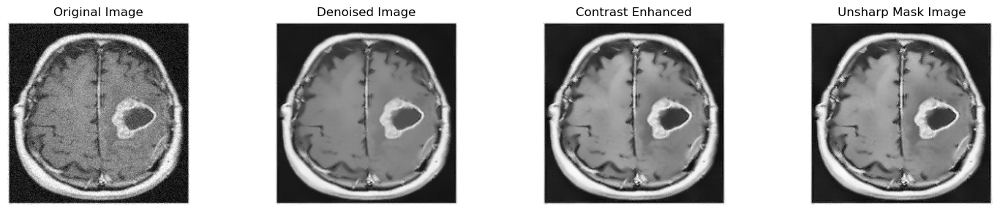

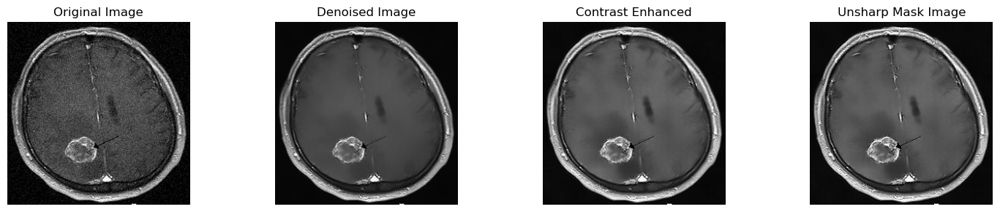

In [20]:
process_and_display_images(yes_noised_data, num_images=5)

In [21]:
def compare_metrics_and_display_maps(img1, img2, label1='Image1', label2='Image2'):
    # Calculate PSNR
    psnr_val = metrics.peak_signal_noise_ratio(img1, img2)
    
    # Calculate SSIM and SSIM map
    ssim_val, ssim_map = metrics.structural_similarity(img1, img2, full=True)

    print(f"PSNR between {label1} and {label2}: {psnr_val:.2f}")
    print(f"SSIM between {label1} and {label2}: {ssim_val:.2f}")

    # Display images and SSIM map
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(img1, cmap='gray')
    axes[0].set_title(f'{label1}')
    axes[0].axis('off')
    
    axes[1].imshow(img2, cmap='gray')
    axes[1].set_title(f'{label2}')
    axes[1].axis('off')
    
    axes[2].imshow(ssim_map, cmap='viridis')
    axes[2].set_title('SSIM Map')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

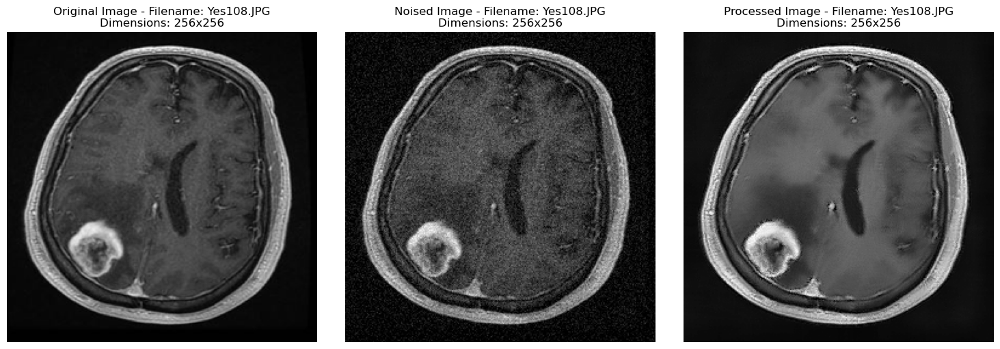

In [22]:
# Select the first image, its label, and filename
i=10
yes_ori_image= yes_ori_data[i]
yes_ori_label = yes_ori_labels[i]
yes_ori_filename = yes_ori_filenames[i]

yes_noised_image= yes_noised_data[i]
yes_noised_label = yes_noised_labels[i]
yes_noised_filename = yes_noised_filenames[i]  

denoised_image1= denoise_image(yes_noised_image)
ec_image1=enhance_contrast(denoised_image1)
um_image1=apply_unsharp_mask(ec_image1)
yes_processed_image=um_image1
yes_processed_label = yes_noised_label
yes_processed_filename = yes_noised_filename

fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display the original image along with its filename and dimensions
axes[0].imshow(yes_ori_image, cmap='gray')
axes[0].set_title(f'Original Image - Filename: {yes_ori_filename}\nDimensions: {yes_ori_image.shape[0]}x{yes_ori_image.shape[1]}')
axes[0].axis('off')  # Turn off axis numbering

# Display the noised image along with its filename and dimensions
axes[1].imshow(yes_noised_image, cmap='gray')
axes[1].set_title(f'Noised Image - Filename: {yes_noised_filename}\nDimensions: {yes_noised_image.shape[0]}x{yes_noised_image.shape[1]}')
axes[1].axis('off')

# Display the processed image along with its filename and dimensions
axes[2].imshow(yes_processed_image, cmap='gray')
axes[2].set_title(f'Processed Image - Filename: {yes_processed_filename}\nDimensions: {yes_processed_image.shape[0]}x{yes_processed_image.shape[1]}')
axes[2].axis('off')

plt.tight_layout()  # Adjust layout to make room for titles
plt.show()

PSNR between Original and Noised: 25.28
SSIM between Original and Noised: 0.54


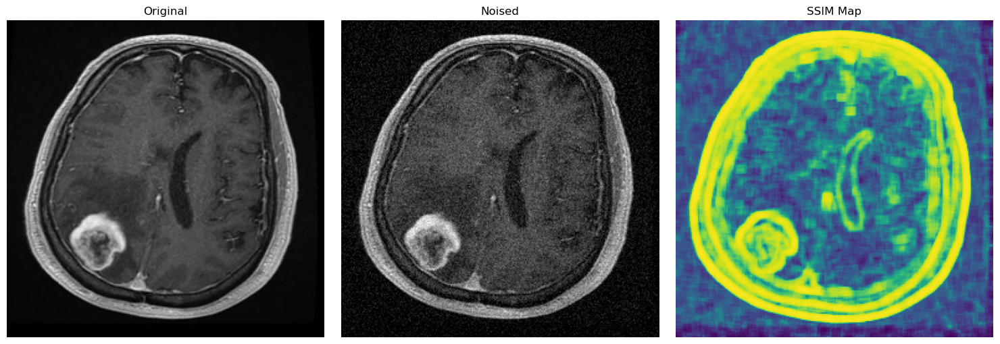

PSNR between Original and Processed: 30.98
SSIM between Original and Processed: 0.84


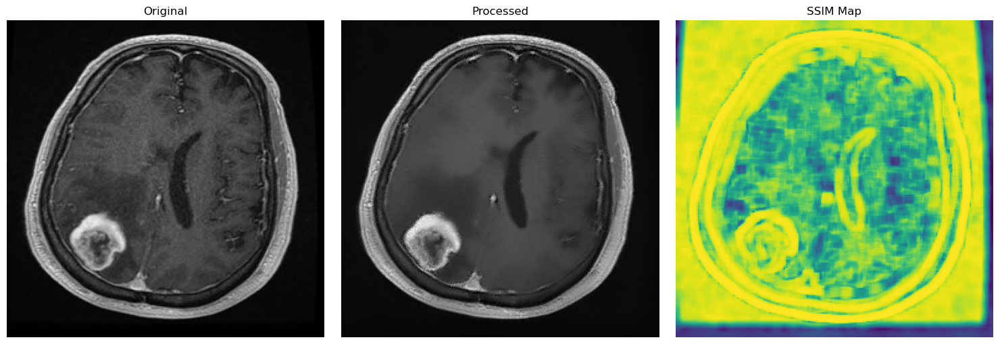

In [23]:
# Compare original with noised image
compare_metrics_and_display_maps(yes_ori_image, yes_noised_image, label1='Original', label2='Noised')

# Compare original with processed image
compare_metrics_and_display_maps(yes_ori_image, denoised_image1, label1='Original', label2='Processed')

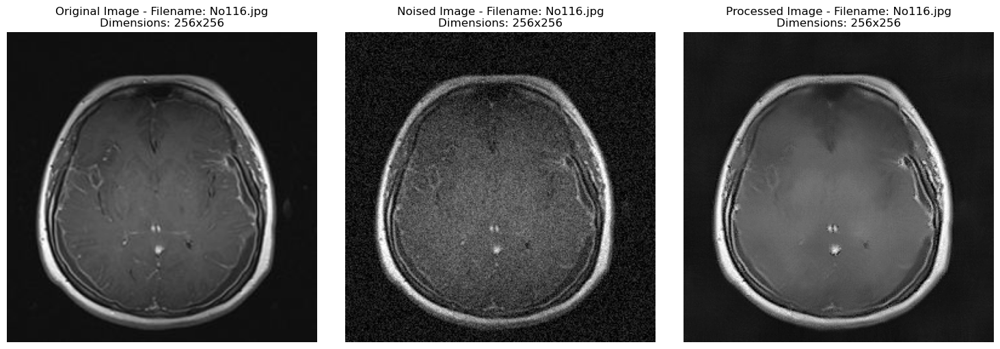

In [54]:
# Select the first image, its label, and filename from the 'no tumor' data
i=19
no_ori_image = no_ori_data[i]
no_ori_label = no_ori_labels[i]
no_ori_filename = no_ori_filenames[i]

no_noised_image = no_noised_data[i]
no_noised_label = no_noised_labels[i]
no_noised_filename = no_noised_filenames[i]  

denoised_image2= denoise_image(no_noised_image)
ec_image2=enhance_contrast(denoised_image2)
um_image2=apply_unsharp_mask(ec_image2)
no_processed_image=um_image2
no_processed_label = no_noised_label
no_processed_filename = no_noised_filename



fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Display the original image along with its filename and dimensions
axes[0].imshow(no_ori_image, cmap='gray')
axes[0].set_title(f'Original Image - Filename: {no_ori_filename}\nDimensions: {no_ori_image.shape[0]}x{no_ori_image.shape[1]}')
axes[0].axis('off')  # Turn off axis numbering

# Display the noised image along with its filename and dimensions
axes[1].imshow(no_noised_image, cmap='gray')
axes[1].set_title(f'Noised Image - Filename: {no_noised_filename}\nDimensions: {no_noised_image.shape[0]}x{no_noised_image.shape[1]}')
axes[1].axis('off')

# Display the processed image along with its filename and dimensions
axes[2].imshow(no_processed_image, cmap='gray')
axes[2].set_title(f'Processed Image - Filename: {no_processed_filename}\nDimensions: {no_processed_image.shape[0]}x{no_processed_image.shape[1]}')
axes[2].axis('off')

plt.tight_layout()  # Adjust layout to make room for titles
plt.show()


PSNR between Original and Noised: 24.91
SSIM between Original and Noised: 0.42


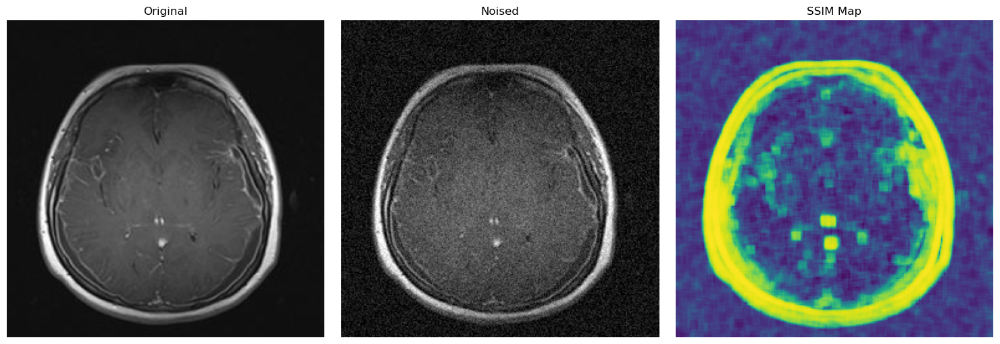

PSNR between Original and Processed: 25.95
SSIM between Original and Processed: 0.87


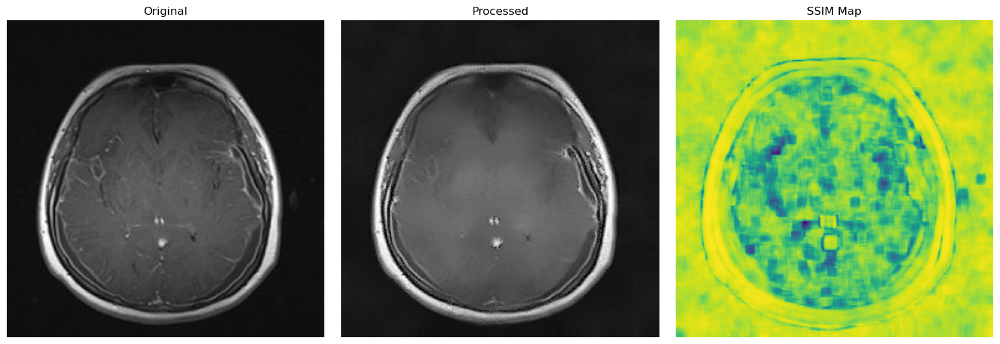

In [56]:
# Compare original with noised image
compare_metrics_and_display_maps(no_ori_image, no_noised_image, label1='Original', label2='Noised')

# Compare original with processed image
compare_metrics_and_display_maps(no_ori_image, no_processed_image, label1='Original', label2='Processed')